In [1]:
!pip install transformers  timm einops flash_attn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 20.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cuspa

# Load the Model.

In [2]:
from transformers import AutoProcessor, AutoModelForCausalLM

from PIL import Image

import requests
import copy

%matplotlib inline

In [3]:
model_id = 'microsoft/Florence-2-large'

model = AutoModelForCausalLM.from_pretrained(model_id,
                                             trust_remote_code=True).eval()

processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/2.44k [00:00<?, ?B/s]

configuration_florence2.py:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_florence2.py:   0%|          | 0.00/127k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- modeling_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


pytorch_model.bin:   0%|          | 0.00/1.54G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/51.0 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py:   0%|          | 0.00/46.4k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

# Contents

1. Caption. <br>
  i. CAPTION. <br>
  ii. DETAILED_CAPTION. <br>
  iii. MORE_DETAILED_CAPTION.

2. Object Detection. <br>
  i. OD. <br>
  ii. DENSE_REGION_CAPTION. <br>
  iii. REGION_PROPOSAL

Pre-defined tasks that requires additional inputs:


3. Phrase Grounding <br>
  i. CAPTION_TO_PHRASE_GROUNDING.

4. Open Vocabulary Detection: detect both objects and ocr texts <br>
  i. OPEN_VOCABULARY_DETECTION.

5. Segmentation: <br>
  i. REFERRING_EXPRESSION_SEGMENTATION <br>
  ii. REGION_TO_SEGMENTATION <br>

6. Region to Text <br>
  i. REGION_TO_CATEGORY <br>
  ii. REGION_TO_DESCRIPTION <br>

7. OCR <br>
  i. OCR <br>
  ii. OCR_WITH_REGION

# Helper Function.

In [9]:
def run_example(task_prompt, text_input = None):
  """
    Calling Microsoft Florence-2 model
  """
  if text_input is None:
    prompt = task_prompt
  else:
    prompt = task_prompt + text_input

  inputs = processor(text = prompt,
                     images = image,
                     return_tensors = "pt")

  print(inputs)
  print('#----------------------------#')

  generated_ids = model.generate(
      input_ids = inputs["input_ids"],
      pixel_values = inputs['pixel_values'],
      max_new_tokens = 1024,
      early_stopping = False,
      do_sample = False,
      num_beams = 3
  )

  print(generated_ids)
  print('#----------------------------#')


  generated_text = processor.batch_decode(generated_ids,
                                          skip_special_tokens=False)[0]

  print(generated_text)
  print('#----------------------------#')


  parsed_answer = processor.post_process_generation(
      generated_text,
      task = task_prompt,
      image_size = (image.width,
                    image.height)
  )

  print(parsed_answer)
  print('#----------------------------#')


  return parsed_answer



# Init Image

In [6]:
img_url = '/content/test_1.jpeg'
# image = Image.open(requests.get(url, stream=True).raw)
image = Image.open(img_url)

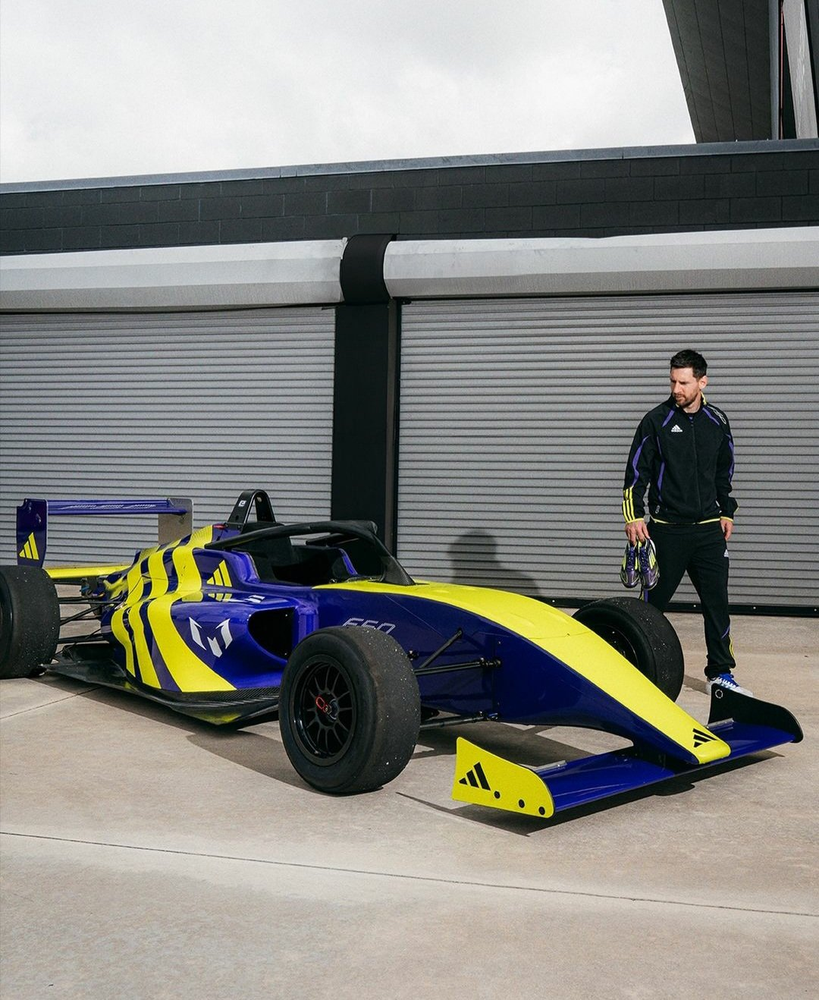

In [7]:
image

# Run pre-defined task without additional inputs.

## Captions.

### Task

```
  1. Caption.
```

In [12]:
task_prompt = '<CAPTION>'
result = run_example(task_prompt)

{'input_ids': tensor([[   0, 2264,  473,    5, 2274, 6190,  116,    2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 1.7180,  1.9064,  1.8893,  ..., -1.2445, -1.4158, -1.2103],
          [ 1.7352,  1.9064,  1.9235,  ..., -1.2103, -1.3644, -1.2103],
          [ 1.7694,  1.9064,  1.9064,  ..., -1.2274, -1.3815, -1.2274],
          ...,
          [ 0.8276,  1.1015,  0.9817,  ...,  0.9988,  0.9988,  0.9817],
          [ 0.9646,  1.0844,  1.1187,  ...,  1.0502,  0.9817,  0.9817],
          [ 0.8618,  0.9474,  1.1015,  ...,  1.1529,  1.1015,  1.0331]],

         [[ 1.9034,  2.0959,  2.0784,  ..., -1.0553, -1.2304, -1.0203],
          [ 1.9209,  2.0959,  2.1134,  ..., -1.0203, -1.1779, -1.0203],
          [ 1.9559,  2.0959,  2.0959,  ..., -1.0378, -1.1954, -1.0378],
          ...,
          [ 0.8354,  1.1155,  1.0105,  ...,  0.9405,  0.9580,  0.9230],
          [ 0.9755,  1.0980,  1.1331,  ...,  0.9930,  0.9230,  0.9230],
          [ 0.8704,  0.9580,  1.

In [13]:
print("\033[1;31;34m")
print(result)


{'<CAPTION>': 'A man standing next to a blue and yellow race car.'}


### Task

```
  2. Detailed Caption.
```

In [14]:
task_prompt = '<DETAILED_CAPTION>'
result = run_example(task_prompt)

{'input_ids': tensor([[    0, 47066, 21700,    11,  4617,    99,    16,  2343,    11,     5,
          2274,     4,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 1.7180,  1.9064,  1.8893,  ..., -1.2445, -1.4158, -1.2103],
          [ 1.7352,  1.9064,  1.9235,  ..., -1.2103, -1.3644, -1.2103],
          [ 1.7694,  1.9064,  1.9064,  ..., -1.2274, -1.3815, -1.2274],
          ...,
          [ 0.8276,  1.1015,  0.9817,  ...,  0.9988,  0.9988,  0.9817],
          [ 0.9646,  1.0844,  1.1187,  ...,  1.0502,  0.9817,  0.9817],
          [ 0.8618,  0.9474,  1.1015,  ...,  1.1529,  1.1015,  1.0331]],

         [[ 1.9034,  2.0959,  2.0784,  ..., -1.0553, -1.2304, -1.0203],
          [ 1.9209,  2.0959,  2.1134,  ..., -1.0203, -1.1779, -1.0203],
          [ 1.9559,  2.0959,  2.0959,  ..., -1.0378, -1.1954, -1.0378],
          ...,
          [ 0.8354,  1.1155,  1.0105,  ...,  0.9405,  0.9580,  0.9230],
          [ 0.9755,  1.0980,  1.1331,

In [15]:
print("\033[1;31;34m")
print(result)


{'<DETAILED_CAPTION>': 'The image shows a man standing next to a blue and yellow race car in front of a building. He is wearing a black jacket and pants, and is holding a helmet in his hand. The sky is visible in the background, and the building has shutters.'}


### Task

```
  3, More Detailed Caption.
```

In [16]:
task_prompt = '<MORE_DETAILED_CAPTION>'
result = run_example(task_prompt)

{'input_ids': tensor([[    0, 47066, 21700,    19,    10, 17818,    99,    16,  2343,    11,
             5,  2274,     4,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 1.7180,  1.9064,  1.8893,  ..., -1.2445, -1.4158, -1.2103],
          [ 1.7352,  1.9064,  1.9235,  ..., -1.2103, -1.3644, -1.2103],
          [ 1.7694,  1.9064,  1.9064,  ..., -1.2274, -1.3815, -1.2274],
          ...,
          [ 0.8276,  1.1015,  0.9817,  ...,  0.9988,  0.9988,  0.9817],
          [ 0.9646,  1.0844,  1.1187,  ...,  1.0502,  0.9817,  0.9817],
          [ 0.8618,  0.9474,  1.1015,  ...,  1.1529,  1.1015,  1.0331]],

         [[ 1.9034,  2.0959,  2.0784,  ..., -1.0553, -1.2304, -1.0203],
          [ 1.9209,  2.0959,  2.1134,  ..., -1.0203, -1.1779, -1.0203],
          [ 1.9559,  2.0959,  2.0959,  ..., -1.0378, -1.1954, -1.0378],
          ...,
          [ 0.8354,  1.1155,  1.0105,  ...,  0.9405,  0.9580,  0.9230],
          [ 0.9755,  1.0980

In [17]:
print("\033[1;31;34m")
print(result)


{'<MORE_DETAILED_CAPTION>': 'The image shows a man standing next to a blue and yellow race car. The car is parked in front of a grey garage door with a black roof. The man is wearing a black jacket and pants and is holding a helmet in his hand. He appears to be looking at the car with a serious expression on his face. The race car has a sleek design with a pointed nose and a curved body. The wheels are large and black, and the car is painted in a bright yellow and blue color scheme.'}


## Object Detection.




#### Mark Bounding Box and Labels.

In [26]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [31]:
def plot_bbox(image, data):
  # Create a figure and axes
  fig, ax = plt.subplots()

  # Display the image
  ax.imshow(image)

  # Plot each bounding box
  for bbox, label in zip(data['bboxes'], data['labels']):
    # Unpack the BBox coordinates
    x1, y1, x2, y2 = bbox
    # Create a rectangle mark
    rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='r', facecolor='none')
    # Add the rectangle to the Axes
    ax.add_patch(rect)
    # Annotate the label
    plt.text(x1, y1, label, color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))

  # Remove the axis ticks and labels
  ax.axis('off')

  # Show the plot
  plt.show()

### Object Detection.

```
# OD results format:
{'<OD>':
  {
    'bboxes': [[x1, y1, x2, y2], ...],
    'labels': ['label1', 'label2', ...]
  }
}
```

In [24]:
task_prompt = '<OD>'
result = run_example(task_prompt)

{'input_ids': tensor([[    0,   574, 22486,     5,  8720,    19,  4120,   766,    11,     5,
          2274,     4,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 1.7180,  1.9064,  1.8893,  ..., -1.2445, -1.4158, -1.2103],
          [ 1.7352,  1.9064,  1.9235,  ..., -1.2103, -1.3644, -1.2103],
          [ 1.7694,  1.9064,  1.9064,  ..., -1.2274, -1.3815, -1.2274],
          ...,
          [ 0.8276,  1.1015,  0.9817,  ...,  0.9988,  0.9988,  0.9817],
          [ 0.9646,  1.0844,  1.1187,  ...,  1.0502,  0.9817,  0.9817],
          [ 0.8618,  0.9474,  1.1015,  ...,  1.1529,  1.1015,  1.0331]],

         [[ 1.9034,  2.0959,  2.0784,  ..., -1.0553, -1.2304, -1.0203],
          [ 1.9209,  2.0959,  2.1134,  ..., -1.0203, -1.1779, -1.0203],
          [ 1.9559,  2.0959,  2.0959,  ..., -1.0378, -1.1954, -1.0378],
          ...,
          [ 0.8354,  1.1155,  1.0105,  ...,  0.9405,  0.9580,  0.9230],
          [ 0.9755,  1.0980,  1.1331,

In [25]:
print("\033[1;31;34m")
print(result)


{'<OD>': {'bboxes': [[0.5400000214576721, 645.1609497070312, 1060.02001953125, 1082.7369384765625], [930.4200439453125, 887.6729736328125, 995.2200317382812, 921.9409790039062], [818.1000366210938, 459.322998046875, 997.3800659179688, 917.9869995117188], [359.1000061035156, 832.3169555664062, 554.5800170898438, 1047.1510009765625], [752.2200317382812, 787.5050048828125, 903.4200439453125, 928.5309448242188], [0.5400000214576721, 745.3289794921875, 80.46000671386719, 896.8989868164062]], 'labels': ['car', 'footwear', 'man', 'wheel', 'wheel', 'wheel']}}


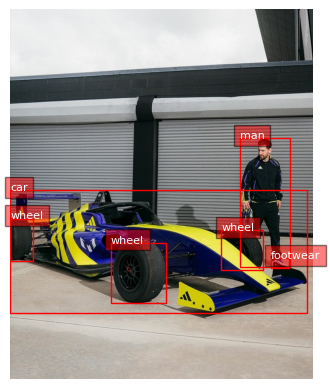

In [32]:
plot_bbox(image, result['<OD>'])

### Dense Region Caption.

Bounding Box with small caption.

```
Dense region caption results format:
{'<DENSE_REGION_CAPTION>':
  {'bboxes': [[x1, y1, x2, y2], ...],
  'labels': ['label1', 'label2', ...]
  }
}
```



In [33]:
task_prompt = '<DENSE_REGION_CAPTION>'
result = run_example(task_prompt)

{'input_ids': tensor([[    0,   574, 22486,     5,  8720,    11,     5,  2274,     6,    19,
            49, 24173,     4,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 1.7180,  1.9064,  1.8893,  ..., -1.2445, -1.4158, -1.2103],
          [ 1.7352,  1.9064,  1.9235,  ..., -1.2103, -1.3644, -1.2103],
          [ 1.7694,  1.9064,  1.9064,  ..., -1.2274, -1.3815, -1.2274],
          ...,
          [ 0.8276,  1.1015,  0.9817,  ...,  0.9988,  0.9988,  0.9817],
          [ 0.9646,  1.0844,  1.1187,  ...,  1.0502,  0.9817,  0.9817],
          [ 0.8618,  0.9474,  1.1015,  ...,  1.1529,  1.1015,  1.0331]],

         [[ 1.9034,  2.0959,  2.0784,  ..., -1.0553, -1.2304, -1.0203],
          [ 1.9209,  2.0959,  2.1134,  ..., -1.0203, -1.1779, -1.0203],
          [ 1.9559,  2.0959,  2.0959,  ..., -1.0378, -1.1954, -1.0378],
          ...,
          [ 0.8354,  1.1155,  1.0105,  ...,  0.9405,  0.9580,  0.9230],
          [ 0.9755,  1.0980

In [34]:
print("\033[1;31;34m")
print(result)


{'<DENSE_REGION_CAPTION>': {'bboxes': [[0.5400000214576721, 645.1609497070312, 1060.02001953125, 1082.7369384765625], [818.1000366210938, 458.0049743652344, 997.3800659179688, 917.9869995117188], [359.1000061035156, 833.6349487304688, 554.5800170898438, 1047.1510009765625], [752.2200317382812, 787.5050048828125, 903.4200439453125, 928.5309448242188], [0.5400000214576721, 745.3289794921875, 80.46000671386719, 896.8989868164062], [930.4200439453125, 887.6729736328125, 995.2200317382812, 921.9409790039062]], 'labels': ['blue and yellow race car with yellow and black stripes', 'man in black Adidas tracksuit with yellow accents', 'wheel', 'wheel', 'wheel', 'footwear']}}


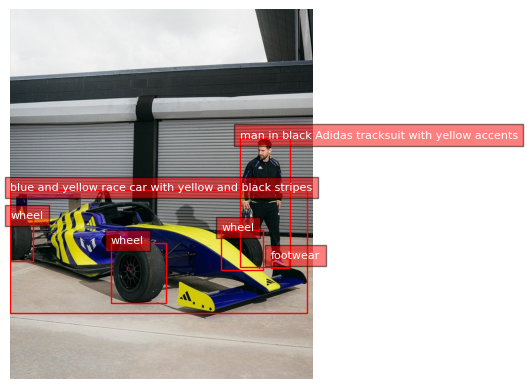

In [35]:
plot_bbox(image, result['<DENSE_REGION_CAPTION>'])

### Region Proposal

Just Bounding box.

```
# Region proposal results format:
{'' :
  {'bboxes': [[x1, y1, x2, y2], ...],
  'labels': ['', '', ...]
  }
}
```



In [39]:
task_prompt = '<REGION_PROPOSAL>'
result = run_example(task_prompt)

{'input_ids': tensor([[    0,   574, 22486,     5,   976,  5327,    11,     5,  2274,     4,
             2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 1.7180,  1.9064,  1.8893,  ..., -1.2445, -1.4158, -1.2103],
          [ 1.7352,  1.9064,  1.9235,  ..., -1.2103, -1.3644, -1.2103],
          [ 1.7694,  1.9064,  1.9064,  ..., -1.2274, -1.3815, -1.2274],
          ...,
          [ 0.8276,  1.1015,  0.9817,  ...,  0.9988,  0.9988,  0.9817],
          [ 0.9646,  1.0844,  1.1187,  ...,  1.0502,  0.9817,  0.9817],
          [ 0.8618,  0.9474,  1.1015,  ...,  1.1529,  1.1015,  1.0331]],

         [[ 1.9034,  2.0959,  2.0784,  ..., -1.0553, -1.2304, -1.0203],
          [ 1.9209,  2.0959,  2.1134,  ..., -1.0203, -1.1779, -1.0203],
          [ 1.9559,  2.0959,  2.0959,  ..., -1.0378, -1.1954, -1.0378],
          ...,
          [ 0.8354,  1.1155,  1.0105,  ...,  0.9405,  0.9580,  0.9230],
          [ 0.9755,  1.0980,  1.1331,  ...,  0.9930,  0.9

In [40]:
print("\033[1;31;34m")
print(result)


{'<REGION_PROPOSAL>': {'bboxes': [[1.6200001239776611, 645.1609497070312, 1060.02001953125, 1082.7369384765625], [818.1000366210938, 458.0049743652344, 997.3800659179688, 917.9869995117188], [359.1000061035156, 833.6349487304688, 554.5800170898438, 1047.1510009765625], [822.4200439453125, 506.77099609375, 981.1800537109375, 704.4710083007812], [847.260009765625, 684.7009887695312, 974.7000122070312, 891.626953125], [752.2200317382812, 787.5050048828125, 903.4200439453125, 928.5309448242188], [0.5400000214576721, 745.3289794921875, 80.46000671386719, 896.8989868164062], [930.4200439453125, 887.6729736328125, 995.2200317382812, 921.9409790039062]], 'labels': ['', '', '', '', '', '', '', '']}}


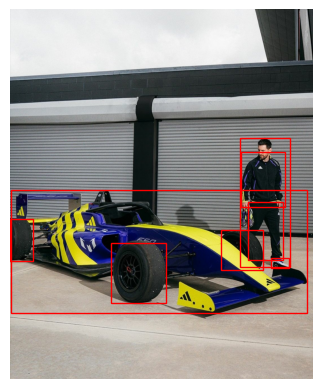

In [41]:
plot_bbox(image, result['<REGION_PROPOSAL>'])

# Run pre-defined tasks that requires additional inputs

### Phrase Grounding

Identify every object in the phrase.



```
# Phrase grounding results format:
{'<CAPTION_TO_PHRASE_GROUNDING>':
  {'bboxes': [[x1, y1, x2, y2], ...],
  'labels': ['', '', ...]
  }
}
```



In [42]:
task_prompt = '<CAPTION_TO_PHRASE_GROUNDING>'
text_input = 'A man beside a racing car'
result = run_example(task_prompt, text_input)

{'input_ids': tensor([[    0,   574, 22486,     5, 22810,    11,     5,  3747,    35,    83,
           313, 13276,    10,  4930,   512,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 1.7180,  1.9064,  1.8893,  ..., -1.2445, -1.4158, -1.2103],
          [ 1.7352,  1.9064,  1.9235,  ..., -1.2103, -1.3644, -1.2103],
          [ 1.7694,  1.9064,  1.9064,  ..., -1.2274, -1.3815, -1.2274],
          ...,
          [ 0.8276,  1.1015,  0.9817,  ...,  0.9988,  0.9988,  0.9817],
          [ 0.9646,  1.0844,  1.1187,  ...,  1.0502,  0.9817,  0.9817],
          [ 0.8618,  0.9474,  1.1015,  ...,  1.1529,  1.1015,  1.0331]],

         [[ 1.9034,  2.0959,  2.0784,  ..., -1.0553, -1.2304, -1.0203],
          [ 1.9209,  2.0959,  2.1134,  ..., -1.0203, -1.1779, -1.0203],
          [ 1.9559,  2.0959,  2.0959,  ..., -1.0378, -1.1954, -1.0378],
          ...,
          [ 0.8354,  1.1155,  1.0105,  ...,  0.9405,  0.9580,  0.9230],
       

In [43]:
print("\033[1;31;34m")
print(result)


{'<CAPTION_TO_PHRASE_GROUNDING>': {'bboxes': [[818.1000366210938, 459.322998046875, 1000.6200561523438, 929.8489990234375], [3.7800002098083496, 643.8429565429688, 1066.5, 1091.9630126953125]], 'labels': ['A man', 'a racing car']}}


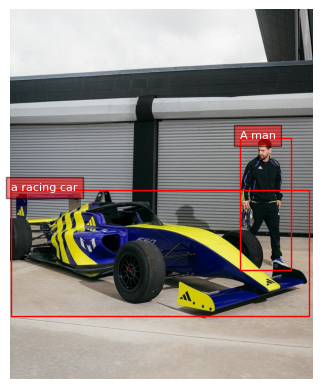

In [44]:
plot_bbox(image, result['<CAPTION_TO_PHRASE_GROUNDING>'])

### Open vocabulary detection
open vocabulary detection can detect both objects and ocr texts.


```
# open vocabulary detection can detect both objects and ocr texts.

results format:

{ '<OPEN_VOCABULARY_DETECTION>':
  {'bboxes': [[x1, y1, x2, y2], [x1, y1, x2, y2], ...]],
  'bboxes_labels': ['label_1', 'label_2', ..],
  'polygons': [[[x1, y1, x2, y2, ..., xn, yn], [x1, y1, ..., xn, yn]], ...],
  'polygons_labels': ['label_1', 'label_2', ...]
  }
}
```



In [60]:
def convert_to_od_format(data):
    """
    Converts a dictionary with 'bboxes' and 'bboxes_labels' into a dictionary with separate 'bboxes' and 'labels' keys.

    Parameters:
    - data: The input dictionary with 'bboxes', 'bboxes_labels', 'polygons', and 'polygons_labels' keys.

    Returns:
    - A dictionary with 'bboxes' and 'labels' keys formatted for object detection results.
    """
    # Extract bounding boxes and labels
    bboxes = data.get('bboxes', [])
    labels = data.get('bboxes_labels', [])

    # Construct the output format
    od_results = {
        'bboxes': bboxes,
        'labels': labels
    }

    return od_results

In [61]:
task_prompt = '<OPEN_VOCABULARY_DETECTION>'
text_input = 'A man'
result = run_example(task_prompt, text_input)

{'input_ids': tensor([[    0,   574, 22486,    83,   313,    11,     5,  2274,     4,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 1.7180,  1.9064,  1.8893,  ..., -1.2445, -1.4158, -1.2103],
          [ 1.7352,  1.9064,  1.9235,  ..., -1.2103, -1.3644, -1.2103],
          [ 1.7694,  1.9064,  1.9064,  ..., -1.2274, -1.3815, -1.2274],
          ...,
          [ 0.8276,  1.1015,  0.9817,  ...,  0.9988,  0.9988,  0.9817],
          [ 0.9646,  1.0844,  1.1187,  ...,  1.0502,  0.9817,  0.9817],
          [ 0.8618,  0.9474,  1.1015,  ...,  1.1529,  1.1015,  1.0331]],

         [[ 1.9034,  2.0959,  2.0784,  ..., -1.0553, -1.2304, -1.0203],
          [ 1.9209,  2.0959,  2.1134,  ..., -1.0203, -1.1779, -1.0203],
          [ 1.9559,  2.0959,  2.0959,  ..., -1.0378, -1.1954, -1.0378],
          ...,
          [ 0.8354,  1.1155,  1.0105,  ...,  0.9405,  0.9580,  0.9230],
          [ 0.9755,  1.0980,  1.1331,  ...,  0.9930,  0.9230,  0.9230],
    

In [62]:
print("\033[1;31;34m")
print(result)


{'<OPEN_VOCABULARY_DETECTION>': {'bboxes': [[818.1000366210938, 459.322998046875, 999.5400390625, 928.5309448242188]], 'bboxes_labels': ['A man'], 'polygons': [], 'polygons_labels': []}}


In [63]:
bbox_results  = convert_to_od_format(result['<OPEN_VOCABULARY_DETECTION>'])

In [64]:
print("\033[1;31;34m")
print(bbox_results)


{'bboxes': [[818.1000366210938, 459.322998046875, 999.5400390625, 928.5309448242188]], 'labels': ['A man']}


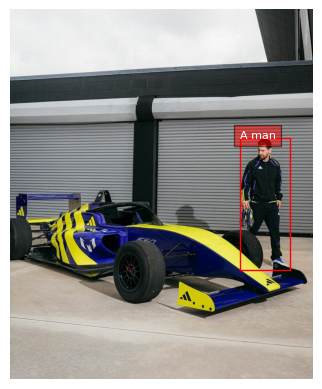

In [65]:
plot_bbox(image, bbox_results)

# Referring Expression Segmentation.

### Draw Segmentation

In [45]:
from PIL import Image, ImageDraw, ImageFont
import random
import numpy as np

In [46]:
colormap = ['blue','orange','green','purple','brown','pink','gray','olive','cyan','red',
            'lime','indigo','violet','aqua','magenta','coral','gold','tan','skyblue']

In [47]:
def draw_polygons(image, prediction, fill_mask=False):
    """
    Draws segmentation masks with polygons on an image.

    Parameters:
    - image_path: Path to the image file.
    - prediction: Dictionary containing 'polygons' and 'labels' keys.
                  'polygons' is a list of lists, each containing vertices of a polygon.
                  'labels' is a list of labels corresponding to each polygon.
    - fill_mask: Boolean indicating whether to fill the polygons with color.
    """
    # Load the image

    draw = ImageDraw.Draw(image)


    # Set up scale factor if needed (use 1 if not scaling)
    scale = 1

    # Iterate over polygons and labels
    for polygons, label in zip(prediction['polygons'], prediction['labels']):
        color = random.choice(colormap)
        fill_color = random.choice(colormap) if fill_mask else None

        for _polygon in polygons:
            _polygon = np.array(_polygon).reshape(-1, 2)
            if len(_polygon) < 3:
                print('Invalid polygon:', _polygon)
                continue

            _polygon = (_polygon * scale).reshape(-1).tolist()

            # Draw the polygon
            if fill_mask:
                draw.polygon(_polygon, outline=color, fill=fill_color)
            else:
                draw.polygon(_polygon, outline=color)

            # Draw the label text
            draw.text((_polygon[0] + 8, _polygon[1] + 2), label, fill=color)

    # Save or display the image
    #image.show()  # Display the image
    display(image)

### Referring expression segmentation


```
# Referring expression segmentation results format:
{'<REFERRING_EXPRESSION_SEGMENTATION>':
  {'Polygons':
      [[[polygon]], ...],
      'labels': ['', '', ...]
    }
  },
  one object is represented by a list of polygons.
  Each polygon is [x1, y1, x2, y2, ..., xn, yn]
```



In [48]:
task_prompt = '<REFERRING_EXPRESSION_SEGMENTATION>'
text_input = 'A man'
result = run_example(task_prompt, text_input)

{'input_ids': tensor([[    0,   574, 22486,    83,   313,    11,     5,  2274,    19, 11445,
             2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 1.7180,  1.9064,  1.8893,  ..., -1.2445, -1.4158, -1.2103],
          [ 1.7352,  1.9064,  1.9235,  ..., -1.2103, -1.3644, -1.2103],
          [ 1.7694,  1.9064,  1.9064,  ..., -1.2274, -1.3815, -1.2274],
          ...,
          [ 0.8276,  1.1015,  0.9817,  ...,  0.9988,  0.9988,  0.9817],
          [ 0.9646,  1.0844,  1.1187,  ...,  1.0502,  0.9817,  0.9817],
          [ 0.8618,  0.9474,  1.1015,  ...,  1.1529,  1.1015,  1.0331]],

         [[ 1.9034,  2.0959,  2.0784,  ..., -1.0553, -1.2304, -1.0203],
          [ 1.9209,  2.0959,  2.1134,  ..., -1.0203, -1.1779, -1.0203],
          [ 1.9559,  2.0959,  2.0959,  ..., -1.0378, -1.1954, -1.0378],
          ...,
          [ 0.8354,  1.1155,  1.0105,  ...,  0.9405,  0.9580,  0.9230],
          [ 0.9755,  1.0980,  1.1331,  ...,  0.9930,  0.9

In [49]:
print("\033[1;31;34m")
print(result)


{'<REFERRING_EXPRESSION_SEGMENTATION>': {'polygons': [[[841.8600463867188, 563.4450073242188, 844.02001953125, 559.490966796875, 846.1800537109375, 556.85498046875, 847.260009765625, 554.218994140625, 849.4200439453125, 551.5830078125, 856.9800415039062, 543.6749877929688, 860.2200317382812, 542.3569946289062, 863.4600219726562, 539.7210083007812, 866.7000122070312, 537.0849609375, 869.9400634765625, 535.7669677734375, 872.1000366210938, 534.448974609375, 874.260009765625, 533.1309814453125, 877.5000610351562, 531.81298828125, 879.6600341796875, 529.177001953125, 882.9000244140625, 527.8590087890625, 886.1400146484375, 525.2229614257812, 887.2200317382812, 522.5869750976562, 887.2200317382812, 515.9970092773438, 886.1400146484375, 514.678955078125, 885.06005859375, 510.7249755859375, 883.9800415039062, 500.18096923828125, 883.9800415039062, 476.45697021484375, 885.06005859375, 473.82098388671875, 886.1400146484375, 471.18499755859375, 890.4600219726562, 467.2309875488281, 893.70001220

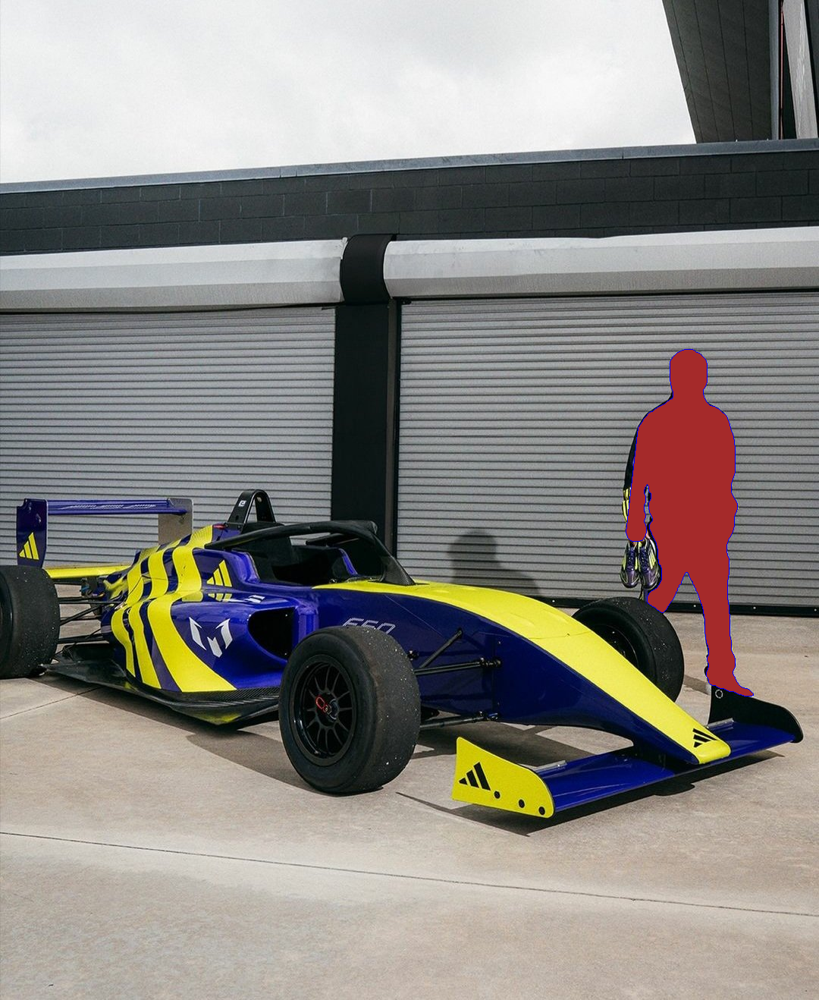

In [51]:
output_image = copy.deepcopy(image)

draw_polygons(output_image, result['<REFERRING_EXPRESSION_SEGMENTATION>'], fill_mask=True)

In [56]:
task_prompt = '<REFERRING_EXPRESSION_SEGMENTATION>'
text_input = 'Car logo'
result = run_example(task_prompt, text_input)

{'input_ids': tensor([[    0,   574, 22486,  1653,  6655,    11,     5,  2274,    19, 11445,
             2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 1.7180,  1.9064,  1.8893,  ..., -1.2445, -1.4158, -1.2103],
          [ 1.7352,  1.9064,  1.9235,  ..., -1.2103, -1.3644, -1.2103],
          [ 1.7694,  1.9064,  1.9064,  ..., -1.2274, -1.3815, -1.2274],
          ...,
          [ 0.8276,  1.1015,  0.9817,  ...,  0.9988,  0.9988,  0.9817],
          [ 0.9646,  1.0844,  1.1187,  ...,  1.0502,  0.9817,  0.9817],
          [ 0.8618,  0.9474,  1.1015,  ...,  1.1529,  1.1015,  1.0331]],

         [[ 1.9034,  2.0959,  2.0784,  ..., -1.0553, -1.2304, -1.0203],
          [ 1.9209,  2.0959,  2.1134,  ..., -1.0203, -1.1779, -1.0203],
          [ 1.9559,  2.0959,  2.0959,  ..., -1.0378, -1.1954, -1.0378],
          ...,
          [ 0.8354,  1.1155,  1.0105,  ...,  0.9405,  0.9580,  0.9230],
          [ 0.9755,  1.0980,  1.1331,  ...,  0.9930,  0.9

In [57]:
print("\033[1;31;34m")
print(result)


{'<REFERRING_EXPRESSION_SEGMENTATION>': {'polygons': [[[246.78001403808594, 812.5469970703125, 248.94000244140625, 811.22900390625, 252.1800079345703, 811.22900390625, 255.42001342773438, 812.5469970703125, 258.6600036621094, 813.864990234375, 261.9000244140625, 815.1829833984375, 264.05999755859375, 815.1829833984375, 267.3000183105469, 816.5009765625, 270.5400085449219, 817.8189697265625, 273.7799987792969, 819.136962890625, 277.02001953125, 820.4549560546875, 280.260009765625, 821.77294921875, 283.5, 821.77294921875, 286.7400207519531, 820.4549560546875, 288.9000244140625, 819.136962890625, 291.05999755859375, 817.8189697265625, 293.2200012207031, 816.5009765625, 295.3800048828125, 815.1829833984375, 297.5400085449219, 813.864990234375, 299.70001220703125, 812.5469970703125, 301.8600158691406, 812.5469970703125, 304.02001953125, 811.22900390625, 306.1800231933594, 811.22900390625, 308.34002685546875, 812.5469970703125, 309.4200134277344, 815.1829833984375, 309.4200134277344, 817.81

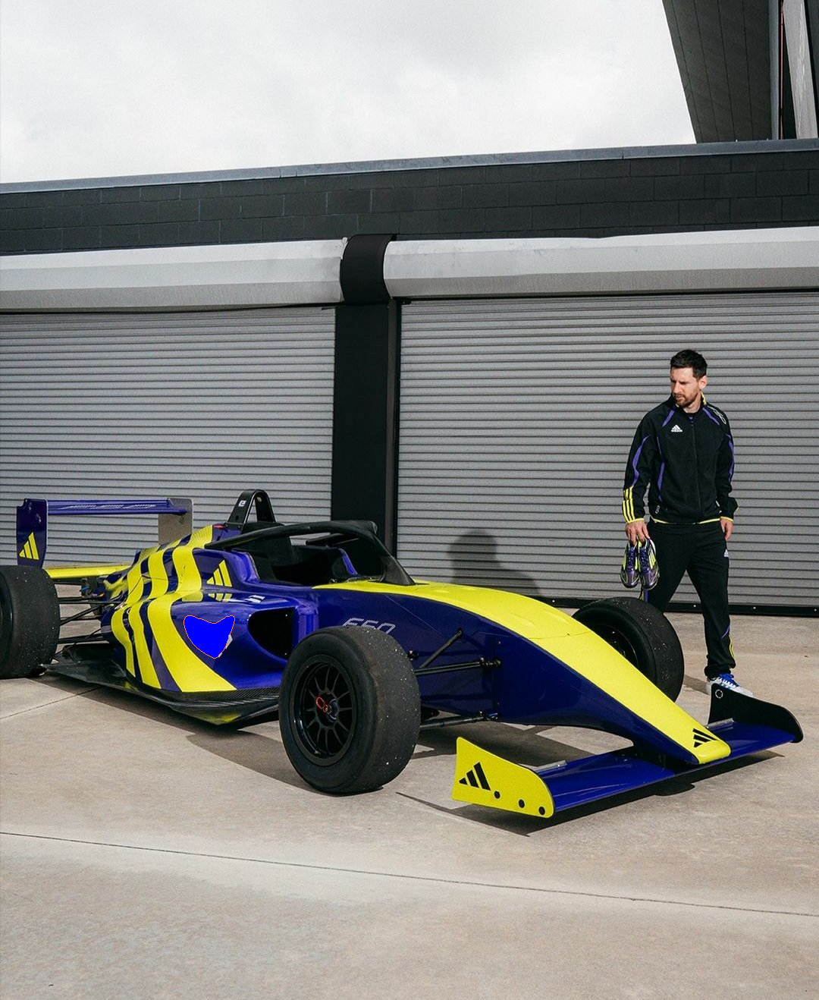

In [58]:
output_image = copy.deepcopy(image)

draw_polygons(output_image, result['<REFERRING_EXPRESSION_SEGMENTATION>'], fill_mask=True)

### Region To Segmentation



```
# with additional region as inputs,
format is:
   '<loc_x1><loc_y1><loc_x2><loc_y2>', [x1, y1, x2, y2]
   is the quantized corrdinates in [0, 999].
```

We can get the region from one of the object detection task.


In [69]:
task_prompt = '<REGION_TO_SEGMENTATION>'
text_input = '<loc_757><loc_348><loc_926><loc_705>'
result = run_example(task_prompt, text_input)

{'input_ids': tensor([[    0,  2264,    16,     5, 11424, 14601, 11445,     9,   976,  1437,
         51026, 50617, 51195, 50974,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 1.7180,  1.9064,  1.8893,  ..., -1.2445, -1.4158, -1.2103],
          [ 1.7352,  1.9064,  1.9235,  ..., -1.2103, -1.3644, -1.2103],
          [ 1.7694,  1.9064,  1.9064,  ..., -1.2274, -1.3815, -1.2274],
          ...,
          [ 0.8276,  1.1015,  0.9817,  ...,  0.9988,  0.9988,  0.9817],
          [ 0.9646,  1.0844,  1.1187,  ...,  1.0502,  0.9817,  0.9817],
          [ 0.8618,  0.9474,  1.1015,  ...,  1.1529,  1.1015,  1.0331]],

         [[ 1.9034,  2.0959,  2.0784,  ..., -1.0553, -1.2304, -1.0203],
          [ 1.9209,  2.0959,  2.1134,  ..., -1.0203, -1.1779, -1.0203],
          [ 1.9559,  2.0959,  2.0959,  ..., -1.0378, -1.1954, -1.0378],
          ...,
          [ 0.8354,  1.1155,  1.0105,  ...,  0.9405,  0.9580,  0.9230],
          [ 0.975

In [70]:
print("\033[1;31;34m")
print(result)


{'<REGION_TO_SEGMENTATION>': {'polygons': [[[841.8600463867188, 563.4450073242188, 845.1000366210938, 558.1729736328125, 848.3400268554688, 552.9010009765625, 856.9800415039062, 543.6749877929688, 863.4600219726562, 539.7210083007812, 868.8600463867188, 535.7669677734375, 874.260009765625, 533.1309814453125, 879.6600341796875, 529.177001953125, 885.06005859375, 523.9049682617188, 886.1400146484375, 514.678955078125, 883.9800415039062, 506.77099609375, 885.06005859375, 473.82098388671875, 890.4600219726562, 467.2309875488281, 895.8600463867188, 463.2769775390625, 901.260009765625, 461.958984375, 910.9800415039062, 461.958984375, 916.3800659179688, 463.2769775390625, 921.780029296875, 467.2309875488281, 929.3400268554688, 475.13897705078125, 931.5000610351562, 480.4109802246094, 930.4200439453125, 502.8169860839844, 928.260009765625, 509.406982421875, 926.1000366210938, 514.678955078125, 927.1800537109375, 521.2689819335938, 929.3400268554688, 526.5409545898438, 933.6600341796875, 531.8

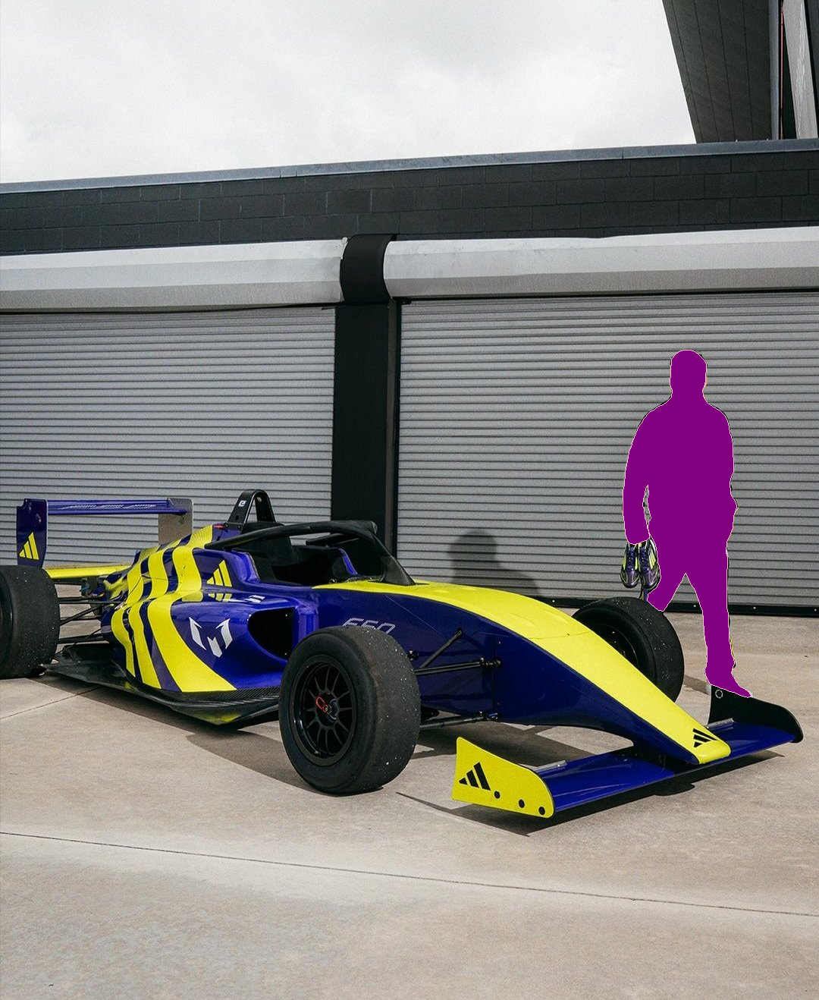

In [71]:
output_image = copy.deepcopy(image)
draw_polygons(output_image, result['<REGION_TO_SEGMENTATION>'], fill_mask=True)

### Region to Text

1. Category.
2. Description.

REGION_TO_CATEGORY

In [72]:
task_prompt = '<REGION_TO_CATEGORY>'
text_input = '<loc_757><loc_348><loc_926><loc_705>'
result = run_example(task_prompt, text_input)

{'input_ids': tensor([[    0,  2264,    16,     5,   976,  1437, 51026, 50617, 51195, 50974,
           116,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 1.7180,  1.9064,  1.8893,  ..., -1.2445, -1.4158, -1.2103],
          [ 1.7352,  1.9064,  1.9235,  ..., -1.2103, -1.3644, -1.2103],
          [ 1.7694,  1.9064,  1.9064,  ..., -1.2274, -1.3815, -1.2274],
          ...,
          [ 0.8276,  1.1015,  0.9817,  ...,  0.9988,  0.9988,  0.9817],
          [ 0.9646,  1.0844,  1.1187,  ...,  1.0502,  0.9817,  0.9817],
          [ 0.8618,  0.9474,  1.1015,  ...,  1.1529,  1.1015,  1.0331]],

         [[ 1.9034,  2.0959,  2.0784,  ..., -1.0553, -1.2304, -1.0203],
          [ 1.9209,  2.0959,  2.1134,  ..., -1.0203, -1.1779, -1.0203],
          [ 1.9559,  2.0959,  2.0959,  ..., -1.0378, -1.1954, -1.0378],
          ...,
          [ 0.8354,  1.1155,  1.0105,  ...,  0.9405,  0.9580,  0.9230],
          [ 0.9755,  1.0980,  1.1331,  ...,  0.

In [73]:
print("\033[1;31;34m")
print(result)


{'<REGION_TO_CATEGORY>': 'man<loc_757><loc_348><loc_926><loc_705>'}


REGION_TO_DESCRIPTION

In [74]:
task_prompt = '<REGION_TO_DESCRIPTION>'
text_input = '<loc_757><loc_348><loc_926><loc_705>'
result = run_example(task_prompt, text_input)

{'input_ids': tensor([[    0,  2264,   473,     5,   976,  1437, 51026, 50617, 51195, 50974,
          6190,   116,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 1.7180,  1.9064,  1.8893,  ..., -1.2445, -1.4158, -1.2103],
          [ 1.7352,  1.9064,  1.9235,  ..., -1.2103, -1.3644, -1.2103],
          [ 1.7694,  1.9064,  1.9064,  ..., -1.2274, -1.3815, -1.2274],
          ...,
          [ 0.8276,  1.1015,  0.9817,  ...,  0.9988,  0.9988,  0.9817],
          [ 0.9646,  1.0844,  1.1187,  ...,  1.0502,  0.9817,  0.9817],
          [ 0.8618,  0.9474,  1.1015,  ...,  1.1529,  1.1015,  1.0331]],

         [[ 1.9034,  2.0959,  2.0784,  ..., -1.0553, -1.2304, -1.0203],
          [ 1.9209,  2.0959,  2.1134,  ..., -1.0203, -1.1779, -1.0203],
          [ 1.9559,  2.0959,  2.0959,  ..., -1.0378, -1.1954, -1.0378],
          ...,
          [ 0.8354,  1.1155,  1.0105,  ...,  0.9405,  0.9580,  0.9230],
          [ 0.9755,  1.0980,  1.1331,

In [75]:
print("\033[1;31;34m")
print(result)


{'<REGION_TO_DESCRIPTION>': 'Lionel Messi Adidas tracksuit<loc_757><loc_348><loc_926><loc_705>'}


### OCR

In [76]:
url = '/content/test_5.jpg'

image = Image.open(url)

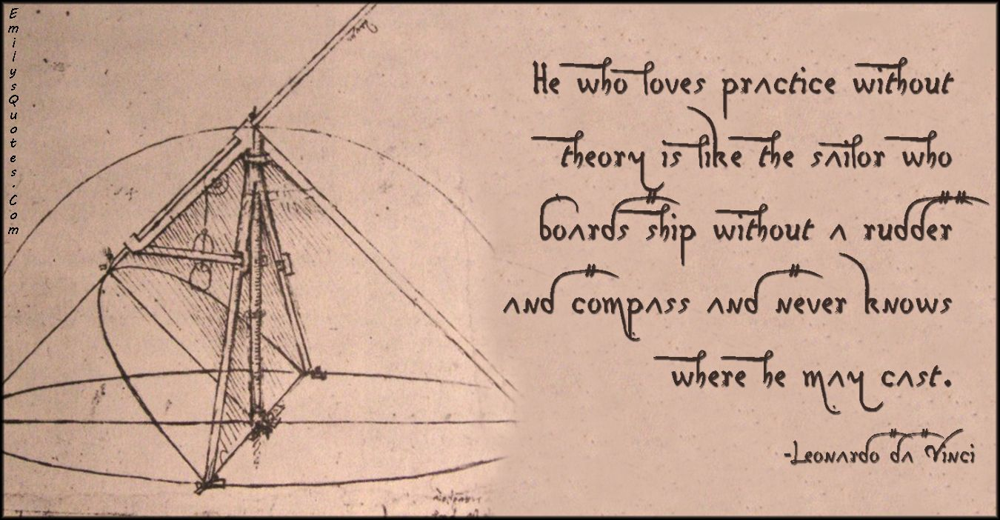

In [77]:
image

In [78]:
task_prompt = '<OCR>'
result = run_example(task_prompt)

{'input_ids': tensor([[   0, 2264,   16,    5, 2788,   11,    5, 2274,  116,    2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[-2.1179, -2.1179, -2.1008,  ..., -1.9809, -2.0152, -1.9980],
          [-2.1008, -2.0665, -2.1179,  ..., -1.9295, -1.9124, -1.9980],
          [-2.0837, -1.9467, -1.8782,  ..., -1.6898, -1.7583, -2.0152],
          ...,
          [-2.0665, -1.8610, -1.7925,  ..., -1.7925, -1.8097, -2.0494],
          [-2.1179, -2.0837, -2.0494,  ..., -2.0152, -1.9980, -2.1008],
          [-2.1179, -2.1008, -2.0665,  ..., -2.1008, -2.1179, -2.1179]],

         [[-2.0182, -2.0007, -2.0182,  ..., -2.0357, -2.0182, -2.0007],
          [-1.9482, -1.9482, -2.0357,  ..., -2.0182, -1.9482, -2.0007],
          [-1.9657, -1.8431, -1.7906,  ..., -1.7731, -1.7906, -2.0182],
          ...,
          [-1.9832, -1.7906, -1.7906,  ..., -1.7031, -1.7381, -1.9832],
          [-2.0357, -2.0182, -2.0357,  ..., -1.9307, -1.9132, -2.0182],
          [-2.

In [79]:
print("\033[1;31;34m")
print(result)


{'<OCR>': 'He who loves pracice withouttheory is like the sailor whos.combonds ship without a ruddermAnD compass AND never Knowswhere he may cast.-Leonardo da Vinci'}


### OCR_WITH_REGION

In [80]:
def draw_ocr_bboxes(image, prediction):
    scale = 1

    draw = ImageDraw.Draw(image)

    bboxes, labels = prediction['quad_boxes'], prediction['labels']

    for box, label in zip(bboxes, labels):
        color = random.choice(colormap)

        new_box = (np.array(box) * scale).tolist()

        draw.polygon(new_box, width=3, outline=color)

        draw.text((new_box[0]+8, new_box[1]+2),
                    "{}".format(label),
                    align="right",

                    fill=color)
    display(image)

In [81]:
task_prompt = '<OCR_WITH_REGION>'
result = run_example(task_prompt)

{'input_ids': tensor([[   0, 2264,   16,    5, 2788,   11,    5, 2274,    6,   19, 3806,  116,
            2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[-2.1179, -2.1179, -2.1008,  ..., -1.9809, -2.0152, -1.9980],
          [-2.1008, -2.0665, -2.1179,  ..., -1.9295, -1.9124, -1.9980],
          [-2.0837, -1.9467, -1.8782,  ..., -1.6898, -1.7583, -2.0152],
          ...,
          [-2.0665, -1.8610, -1.7925,  ..., -1.7925, -1.8097, -2.0494],
          [-2.1179, -2.0837, -2.0494,  ..., -2.0152, -1.9980, -2.1008],
          [-2.1179, -2.1008, -2.0665,  ..., -2.1008, -2.1179, -2.1179]],

         [[-2.0182, -2.0007, -2.0182,  ..., -2.0357, -2.0182, -2.0007],
          [-1.9482, -1.9482, -2.0357,  ..., -2.0182, -1.9482, -2.0007],
          [-1.9657, -1.8431, -1.7906,  ..., -1.7731, -1.7906, -2.0182],
          ...,
          [-1.9832, -1.7906, -1.7906,  ..., -1.7031, -1.7381, -1.9832],
          [-2.0357, -2.0182, -2.0357,  ..., -1.930

In [82]:
print("\033[1;31;34m")
print(result)


{'<OCR_WITH_REGION>': {'quad_boxes': [[716.1749877929688, 77.57099914550781, 1289.925048828125, 77.57099914550781, 1289.925048828125, 133.7310028076172, 716.1749877929688, 133.7310028076172], [753.9750366210938, 182.16900634765625, 1288.5750732421875, 182.16900634765625, 1288.5750732421875, 232.01100158691406, 753.9750366210938, 232.01100158691406], [725.625, 264.3030090332031, 1289.925048828125, 276.23699951171875, 1288.5750732421875, 332.3970031738281, 725.625, 327.4830017089844], [678.375, 392.7690124511719, 1288.5750732421875, 392.7690124511719, 1288.5750732421875, 428.5710144042969, 678.375, 428.5710144042969], [903.8250122070312, 471.39300537109375, 1287.2249755859375, 471.39300537109375, 1287.2249755859375, 529.6589965820312, 903.8250122070312, 529.6589965820312], [1057.7249755859375, 593.541015625, 1320.9749755859375, 593.541015625, 1320.9749755859375, 629.343017578125, 1057.7249755859375, 629.343017578125]], 'labels': ['He who loves practice without', 'theory is like the sail

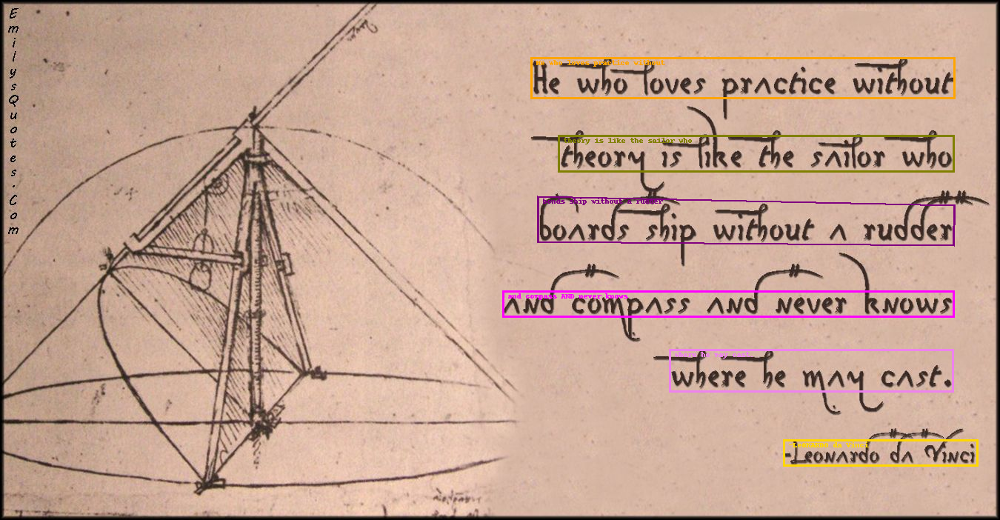

In [83]:
output_image = copy.deepcopy(image)
draw_ocr_bboxes(output_image, result['<OCR_WITH_REGION>'])